In [1]:
from pathlib import Path
import pandas as pd

PROJECT_ROOT = Path("/home/py/groundwater")
DATA = PROJECT_ROOT / "data" / "gown"

In [5]:
df = pd.read_csv(DATA / "combined_absval.csv", parse_dates=[0], index_col=0)

In [6]:
df

,0411,0947,0793,0165,0310,0312,0944,0948,0313,0314,...,0130,0147,0106,0110,0108,0109,0101,0102,0105,0100
date,,,,,,,,,,,,,,,,,,,,,
2005-01-01,NaN,NaN,1034.6820,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,760.83000,782.54700,1176.3688,868.05280,1221.7305,912.81244,1294.3424,867.78217,1172.2051,945.66815
2005-01-02,NaN,NaN,1034.6742,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,760.83170,782.54474,1176.3663,868.05950,1221.7220,912.81396,1294.3942,867.77905,1172.1901,945.66600
2005-01-03,NaN,NaN,1034.6621,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,760.82600,782.54050,1176.3588,868.06110,1221.7135,912.78680,1294.1996,867.77246,1172.1693,945.65300
2005-01-04,NaN,NaN,1034.6736,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,760.81726,782.54297,1176.3574,868.06440,1221.7041,912.73850,1294.2689,867.76105,1172.1527,945.63965
2005-01-05,NaN,NaN,1034.6954,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,760.83250,782.57420,1176.3918,868.07250,1221.7072,912.83780,1294.3107,867.78580,1172.1521,945.68506
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,438.18274,540.17474,1034.5956,NaN,787.82200,846.21136,560.52515,558.14923,846.69310,827.92993,...,762.34270,785.82477,1177.0896,868.98895,1221.0311,913.13965,1293.6555,868.04610,1170.5332,945.20500
2024-12-28,438.15850,540.17050,1034.5927,NaN,787.80804,846.21014,560.52300,558.14606,846.69270,827.94700,...,762.33545,785.81180,1177.0704,868.99097,1221.0289,913.10890,1293.6783,868.03485,1170.5253,945.19220
2024-12-29,438.09448,540.15857,1034.5929,NaN,787.78424,846.20703,560.51825,558.13116,846.69110,827.91770,...,762.32465,785.80554,1177.0652,868.99066,1221.0253,913.06990,1293.6868,868.02875,1170.5167,945.18170


In [4]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from tqdm.auto import tqdm


def impute_rf_per_col(df, n_estimators=200, n_spatial=20, random_state=0):
    """
    Impute missing values column-by-column using Random Forest.

    Strategy
    --------
    - Columns processed in ascending order of missingness (least-missing first)
      so already-imputed neighbours can serve as spatial features for harder ones.
    - Features: cyclic time encodings (sin/cos of doy & month, year, linear t)
      + top-N most-correlated other stations (spatial features).
    - OOB R² reported per column — no extra CV split needed.
    - Progress shown via tqdm with live per-column stats.

    Parameters
    ----------
    df           : pd.DataFrame  (rows=dates, cols=stations)
    n_estimators : int           trees per forest (default 200)
    n_spatial    : int           number of most-correlated stations to include
                                 as spatial features (default 20; 0 = disable)
    random_state : int

    Returns
    -------
    out    : pd.DataFrame  fully imputed copy of df
    scores : dict          {col: oob_r2}  (nan if skipped to interpolation)
    """
    df = df.sort_index().copy()
    idx = df.index

    # Cyclic time features — avoid artificial discontinuity at year/month wrap
    time_feat = pd.DataFrame({
        "t":         np.arange(len(idx)),
        "year":      idx.year,
        "sin_doy":   np.sin(2 * np.pi * idx.dayofyear / 365.25),
        "cos_doy":   np.cos(2 * np.pi * idx.dayofyear / 365.25),
        "sin_month": np.sin(2 * np.pi * idx.month / 12),
        "cos_month": np.cos(2 * np.pi * idx.month / 12),
    }, index=idx)

    out = df.copy()
    missing_pct = df.isna().mean()
    col_order = missing_pct.sort_values().index.tolist()

    # Pre-compute absolute correlations for spatial feature selection
    corr_matrix = df.corr().abs() if n_spatial > 0 else None

    scores = {}
    n_cols = len(col_order)

    pbar = tqdm(col_order, desc="Imputing columns", unit="col", total=n_cols)
    for col in pbar:
        y = out[col].astype(float)
        m = y.notna()
        miss = ~m

        pbar.set_postfix({"col": col, "missing": miss.sum()})

        if m.all():
            scores[col] = 1.0
            continue

        # Too few observations — fall back to time interpolation
        if m.sum() < 50:
            out[col] = y.interpolate(method="time").ffill().bfill()
            scores[col] = float("nan")
            tqdm.write(f"  [INTERP ] {col:12s}  obs={m.sum():5d}  missing={miss.sum():5d}")
            continue

        # Spatial features: top-N correlated stations (use current out, already partially filled)
        if n_spatial > 0 and corr_matrix is not None:
            top_cols = (
                corr_matrix[col]
                .drop(col)
                .nlargest(n_spatial)
                .index.tolist()
            )
            spatial = out[top_cols].apply(lambda s: s.fillna(s.median()))
            X = pd.concat([time_feat, spatial], axis=1)
        else:
            X = time_feat.copy()

        rf = RandomForestRegressor(
            n_estimators=n_estimators,
            max_features="sqrt",
            min_samples_leaf=2,
            n_jobs=-1,
            random_state=random_state,
            oob_score=True,
        )
        rf.fit(X.loc[m], y.loc[m])
        score = rf.oob_score_
        scores[col] = score

        if miss.any():
            out.loc[miss, col] = rf.predict(X.loc[miss])

        tqdm.write(
            f"  [RF     ] {col:12s}  obs={m.sum():5d}  missing={miss.sum():5d}  OOB R²={score:.4f}"
        )

    pbar.close()

    filled = sum(1 for s in scores.values() if not np.isnan(s) and s < 1.0)
    oob_vals = [s for s in scores.values() if not np.isnan(s) and s < 1.0]
    if oob_vals:
        print(f"\nDone. {filled} columns imputed via RF — median OOB R²={np.median(oob_vals):.4f}, "
              f"min={min(oob_vals):.4f}, max={max(oob_vals):.4f}")

    return out, scores

/home/py/mambaforge/envs/research-gwmo/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
df_imputed_rf, scores = impute_rf_per_col(df)

Imputing columns:  13%|█▎        | 22/166 [00:00<00:03, 38.33col/s, col=0340, missing=1]

  [RF     ] 0111          obs= 7304  missing=    1  OOB R²=0.9921


Imputing columns:  13%|█▎        | 22/166 [00:01<00:03, 38.33col/s, col=0190, missing=1]

  [RF     ] 0340          obs= 7304  missing=    1  OOB R²=0.9987


Imputing columns:  13%|█▎        | 22/166 [00:01<00:03, 38.33col/s, col=0375, missing=5]

  [RF     ] 0190          obs= 7304  missing=    1  OOB R²=0.9914


Imputing columns:  13%|█▎        | 22/166 [00:02<00:03, 38.33col/s, col=0110, missing=5]

  [RF     ] 0375          obs= 7300  missing=    5  OOB R²=0.9984


Imputing columns:  16%|█▌        | 26/166 [00:02<00:19,  7.34col/s, col=0109, missing=8]

  [RF     ] 0110          obs= 7300  missing=    5  OOB R²=0.9171


Imputing columns:  16%|█▌        | 26/166 [00:03<00:19,  7.34col/s, col=0226, missing=10]

  [RF     ] 0109          obs= 7297  missing=    8  OOB R²=0.8418


Imputing columns:  17%|█▋        | 28/166 [00:03<00:26,  5.25col/s, col=0239, missing=13]

  [RF     ] 0226          obs= 7295  missing=   10  OOB R²=0.9810


Imputing columns:  17%|█▋        | 29/166 [00:04<00:30,  4.50col/s, col=0195, missing=15]

  [RF     ] 0239          obs= 7292  missing=   13  OOB R²=0.9974


Imputing columns:  18%|█▊        | 30/166 [00:05<00:34,  3.91col/s, col=0129, missing=17]

  [RF     ] 0195          obs= 7290  missing=   15  OOB R²=0.9998


Imputing columns:  19%|█▊        | 31/166 [00:05<00:40,  3.36col/s, col=0172, missing=19]

  [RF     ] 0129          obs= 7288  missing=   17  OOB R²=0.9947


Imputing columns:  19%|█▉        | 32/166 [00:06<00:45,  2.97col/s, col=0100, missing=24]

  [RF     ] 0172          obs= 7286  missing=   19  OOB R²=0.9810


Imputing columns:  20%|█▉        | 33/166 [00:06<00:50,  2.62col/s, col=0275, missing=31]

  [RF     ] 0100          obs= 7281  missing=   24  OOB R²=0.9987


Imputing columns:  20%|██        | 34/166 [00:07<00:55,  2.37col/s, col=0157, missing=32]

  [RF     ] 0275          obs= 7274  missing=   31  OOB R²=0.9873


Imputing columns:  21%|██        | 35/166 [00:07<01:00,  2.18col/s, col=0325, missing=33]

  [RF     ] 0157          obs= 7273  missing=   32  OOB R²=0.9997


Imputing columns:  22%|██▏       | 36/166 [00:08<01:03,  2.04col/s, col=0212, missing=37]

  [RF     ] 0325          obs= 7272  missing=   33  OOB R²=0.9721


Imputing columns:  22%|██▏       | 37/166 [00:09<01:05,  1.97col/s, col=0298, missing=37]

  [RF     ] 0212          obs= 7268  missing=   37  OOB R²=0.9891


Imputing columns:  23%|██▎       | 38/166 [00:09<01:07,  1.90col/s, col=0374, missing=39]

  [RF     ] 0298          obs= 7268  missing=   37  OOB R²=0.9852


Imputing columns:  23%|██▎       | 39/166 [00:10<01:10,  1.81col/s, col=0380, missing=39]

  [RF     ] 0374          obs= 7266  missing=   39  OOB R²=0.9951


Imputing columns:  24%|██▍       | 40/166 [00:10<01:09,  1.82col/s, col=0193, missing=54]

  [RF     ] 0380          obs= 7266  missing=   39  OOB R²=0.9997


Imputing columns:  25%|██▍       | 41/166 [00:11<01:09,  1.81col/s, col=0120, missing=54]

  [RF     ] 0193          obs= 7251  missing=   54  OOB R²=0.9911


Imputing columns:  25%|██▌       | 42/166 [00:11<01:09,  1.79col/s, col=0125, missing=63]

  [RF     ] 0120          obs= 7251  missing=   54  OOB R²=0.9305


Imputing columns:  26%|██▌       | 43/166 [00:12<01:08,  1.81col/s, col=0197, missing=65]

  [RF     ] 0125          obs= 7242  missing=   63  OOB R²=0.9991


Imputing columns:  27%|██▋       | 44/166 [00:13<01:08,  1.79col/s, col=0384, missing=67]

  [RF     ] 0197          obs= 7240  missing=   65  OOB R²=0.9996


Imputing columns:  27%|██▋       | 45/166 [00:13<01:08,  1.78col/s, col=0260, missing=71]

  [RF     ] 0384          obs= 7238  missing=   67  OOB R²=0.9984


Imputing columns:  28%|██▊       | 46/166 [00:14<01:08,  1.74col/s, col=0223, missing=71]

  [RF     ] 0260          obs= 7234  missing=   71  OOB R²=0.5382


Imputing columns:  28%|██▊       | 47/166 [00:14<01:07,  1.76col/s, col=0139, missing=73]

  [RF     ] 0223          obs= 7234  missing=   71  OOB R²=0.9984


Imputing columns:  29%|██▉       | 48/166 [00:15<01:07,  1.74col/s, col=0217, missing=79]

  [RF     ] 0139          obs= 7232  missing=   73  OOB R²=0.9953


Imputing columns:  30%|██▉       | 49/166 [00:15<01:08,  1.71col/s, col=0338, missing=91]

  [RF     ] 0217          obs= 7226  missing=   79  OOB R²=0.9992


Imputing columns:  30%|███       | 50/166 [00:16<01:11,  1.63col/s, col=0104, missing=91]

  [RF     ] 0338          obs= 7214  missing=   91  OOB R²=0.9978


Imputing columns:  31%|███       | 51/166 [00:17<01:12,  1.58col/s, col=0292, missing=92]

  [RF     ] 0104          obs= 7214  missing=   91  OOB R²=0.9603


Imputing columns:  31%|███▏      | 52/166 [00:18<01:15,  1.50col/s, col=0148, missing=98]

  [RF     ] 0292          obs= 7213  missing=   92  OOB R²=0.9982


Imputing columns:  32%|███▏      | 53/166 [00:18<01:15,  1.50col/s, col=0150, missing=102]

  [RF     ] 0148          obs= 7207  missing=   98  OOB R²=0.9974


Imputing columns:  33%|███▎      | 54/166 [00:19<01:14,  1.50col/s, col=0240, missing=103]

  [RF     ] 0150          obs= 7203  missing=  102  OOB R²=0.9998


Imputing columns:  33%|███▎      | 55/166 [00:20<01:14,  1.50col/s, col=0114, missing=119]

  [RF     ] 0240          obs= 7202  missing=  103  OOB R²=0.9998


Imputing columns:  34%|███▎      | 56/166 [00:20<01:15,  1.47col/s, col=0274, missing=121]

  [RF     ] 0114          obs= 7186  missing=  119  OOB R²=0.9728


Imputing columns:  34%|███▍      | 57/166 [00:21<01:13,  1.48col/s, col=0286, missing=129]

  [RF     ] 0274          obs= 7184  missing=  121  OOB R²=0.9996


Imputing columns:  35%|███▍      | 58/166 [00:22<01:13,  1.47col/s, col=0364, missing=130]

  [RF     ] 0286          obs= 7176  missing=  129  OOB R²=0.9976


Imputing columns:  36%|███▌      | 59/166 [00:22<01:13,  1.46col/s, col=0142, missing=130]

  [RF     ] 0364          obs= 7175  missing=  130  OOB R²=0.9962


Imputing columns:  36%|███▌      | 60/166 [00:23<01:11,  1.48col/s, col=0309, missing=132]

  [RF     ] 0142          obs= 7175  missing=  130  OOB R²=0.9969


Imputing columns:  37%|███▋      | 61/166 [00:24<01:11,  1.48col/s, col=0381, missing=136]

  [RF     ] 0309          obs= 7173  missing=  132  OOB R²=0.9987


Imputing columns:  37%|███▋      | 62/166 [00:24<01:12,  1.44col/s, col=0186, missing=136]

  [RF     ] 0381          obs= 7169  missing=  136  OOB R²=0.8356


Imputing columns:  38%|███▊      | 63/166 [00:25<01:12,  1.42col/s, col=0194, missing=137]

  [RF     ] 0186          obs= 7169  missing=  136  OOB R²=0.9998


Imputing columns:  39%|███▊      | 64/166 [00:26<01:14,  1.38col/s, col=0370, missing=143]

  [RF     ] 0194          obs= 7168  missing=  137  OOB R²=0.9978


Imputing columns:  39%|███▉      | 65/166 [00:27<01:13,  1.37col/s, col=0143, missing=143]

  [RF     ] 0370          obs= 7162  missing=  143  OOB R²=0.9907


Imputing columns:  40%|███▉      | 66/166 [00:27<01:11,  1.40col/s, col=0371, missing=143]

  [RF     ] 0143          obs= 7162  missing=  143  OOB R²=0.9956


Imputing columns:  40%|████      | 67/166 [00:28<01:09,  1.43col/s, col=0764, missing=149]

  [RF     ] 0371          obs= 7162  missing=  143  OOB R²=0.9999


Imputing columns:  41%|████      | 68/166 [00:29<01:08,  1.44col/s, col=0175, missing=157]

  [RF     ] 0764          obs= 7156  missing=  149  OOB R²=0.9977


Imputing columns:  42%|████▏     | 69/166 [00:29<01:07,  1.43col/s, col=0124, missing=159]

  [RF     ] 0175          obs= 7148  missing=  157  OOB R²=0.9872


Imputing columns:  42%|████▏     | 70/166 [00:30<01:07,  1.42col/s, col=0229, missing=162]

  [RF     ] 0124          obs= 7146  missing=  159  OOB R²=0.9999


Imputing columns:  43%|████▎     | 71/166 [00:31<01:05,  1.45col/s, col=0219, missing=165]

  [RF     ] 0229          obs= 7143  missing=  162  OOB R²=0.9998


Imputing columns:  43%|████▎     | 72/166 [00:31<01:03,  1.47col/s, col=0252, missing=170]

  [RF     ] 0219          obs= 7140  missing=  165  OOB R²=0.9996


Imputing columns:  44%|████▍     | 73/166 [00:32<01:03,  1.46col/s, col=0760, missing=170]

  [RF     ] 0252          obs= 7135  missing=  170  OOB R²=0.9992


Imputing columns:  45%|████▍     | 74/166 [00:33<01:03,  1.45col/s, col=0333, missing=173]

  [RF     ] 0760          obs= 7135  missing=  170  OOB R²=0.9967


Imputing columns:  45%|████▌     | 75/166 [00:33<01:02,  1.45col/s, col=0235, missing=180]

  [RF     ] 0333          obs= 7132  missing=  173  OOB R²=0.8744


Imputing columns:  46%|████▌     | 76/166 [00:34<01:02,  1.44col/s, col=0759, missing=185]

  [RF     ] 0235          obs= 7125  missing=  180  OOB R²=0.9984


Imputing columns:  46%|████▋     | 77/166 [00:35<01:01,  1.44col/s, col=0113, missing=187]

  [RF     ] 0759          obs= 7120  missing=  185  OOB R²=0.9934


Imputing columns:  47%|████▋     | 78/166 [00:36<00:59,  1.47col/s, col=0127, missing=190]

  [RF     ] 0113          obs= 7118  missing=  187  OOB R²=0.9995


Imputing columns:  48%|████▊     | 79/166 [00:36<00:59,  1.46col/s, col=0149, missing=190]

  [RF     ] 0127          obs= 7115  missing=  190  OOB R²=0.9975


Imputing columns:  48%|████▊     | 80/166 [00:37<00:58,  1.47col/s, col=0931, missing=192]

  [RF     ] 0149          obs= 7115  missing=  190  OOB R²=0.9892


Imputing columns:  49%|████▉     | 81/166 [00:38<00:58,  1.46col/s, col=0227, missing=196]

  [RF     ] 0931          obs= 7113  missing=  192  OOB R²=0.9949


Imputing columns:  49%|████▉     | 82/166 [00:38<00:57,  1.47col/s, col=0228, missing=196]

  [RF     ] 0227          obs= 7109  missing=  196  OOB R²=0.9989


Imputing columns:  50%|█████     | 83/166 [00:39<00:56,  1.47col/s, col=0187, missing=202]

  [RF     ] 0228          obs= 7109  missing=  196  OOB R²=0.9268


Imputing columns:  51%|█████     | 84/166 [00:40<00:55,  1.47col/s, col=0121, missing=203]

  [RF     ] 0187          obs= 7103  missing=  202  OOB R²=0.9999


Imputing columns:  51%|█████     | 85/166 [00:40<00:55,  1.47col/s, col=0191, missing=209]

  [RF     ] 0121          obs= 7102  missing=  203  OOB R²=0.9991


Imputing columns:  52%|█████▏    | 86/166 [00:41<00:54,  1.47col/s, col=0387, missing=213]

  [RF     ] 0191          obs= 7096  missing=  209  OOB R²=0.6807


Imputing columns:  52%|█████▏    | 87/166 [00:42<00:54,  1.46col/s, col=0376, missing=216]

  [RF     ] 0387          obs= 7092  missing=  213  OOB R²=0.9931


Imputing columns:  53%|█████▎    | 88/166 [00:42<00:52,  1.48col/s, col=0162, missing=221]

  [RF     ] 0376          obs= 7089  missing=  216  OOB R²=0.9998


Imputing columns:  54%|█████▎    | 89/166 [00:43<00:51,  1.48col/s, col=0220, missing=225]

  [RF     ] 0162          obs= 7084  missing=  221  OOB R²=0.9957


Imputing columns:  54%|█████▍    | 90/166 [00:44<00:51,  1.48col/s, col=0622, missing=228]

  [RF     ] 0220          obs= 7080  missing=  225  OOB R²=0.9999


Imputing columns:  55%|█████▍    | 91/166 [00:44<00:50,  1.47col/s, col=0159, missing=234]

  [RF     ] 0622          obs= 7077  missing=  228  OOB R²=0.9980


Imputing columns:  55%|█████▌    | 92/166 [00:45<00:50,  1.46col/s, col=0230, missing=237]

  [RF     ] 0159          obs= 7071  missing=  234  OOB R²=0.9984


Imputing columns:  56%|█████▌    | 93/166 [00:46<00:49,  1.49col/s, col=0389, missing=240]

  [RF     ] 0230          obs= 7068  missing=  237  OOB R²=0.9992


Imputing columns:  57%|█████▋    | 94/166 [00:46<00:48,  1.49col/s, col=0291, missing=244]

  [RF     ] 0389          obs= 7065  missing=  240  OOB R²=0.9988


Imputing columns:  57%|█████▋    | 95/166 [00:47<00:47,  1.49col/s, col=0091, missing=281]

  [RF     ] 0291          obs= 7061  missing=  244  OOB R²=0.9919


Imputing columns:  58%|█████▊    | 96/166 [00:48<00:47,  1.49col/s, col=0112, missing=282]

  [RF     ] 0091          obs= 7024  missing=  281  OOB R²=0.9991


Imputing columns:  58%|█████▊    | 97/166 [00:48<00:46,  1.49col/s, col=0123, missing=293]

  [RF     ] 0112          obs= 7023  missing=  282  OOB R²=0.9951


Imputing columns:  59%|█████▉    | 98/166 [00:49<00:45,  1.49col/s, col=0287, missing=295]

  [RF     ] 0123          obs= 7012  missing=  293  OOB R²=0.9968


Imputing columns:  60%|█████▉    | 99/166 [00:50<00:46,  1.44col/s, col=0289, missing=297]

  [RF     ] 0287          obs= 7010  missing=  295  OOB R²=0.9913


Imputing columns:  60%|██████    | 100/166 [00:51<00:46,  1.43col/s, col=0258, missing=310]

  [RF     ] 0289          obs= 7008  missing=  297  OOB R²=0.9963


Imputing columns:  61%|██████    | 101/166 [00:51<00:44,  1.45col/s, col=0144, missing=326]

  [RF     ] 0258          obs= 6995  missing=  310  OOB R²=0.9753


Imputing columns:  61%|██████▏   | 102/166 [00:52<00:44,  1.44col/s, col=0378, missing=327]

  [RF     ] 0144          obs= 6979  missing=  326  OOB R²=1.0000


Imputing columns:  62%|██████▏   | 103/166 [00:53<00:43,  1.43col/s, col=0242, missing=337]

  [RF     ] 0378          obs= 6978  missing=  327  OOB R²=0.9650


Imputing columns:  63%|██████▎   | 104/166 [00:53<00:42,  1.46col/s, col=0117, missing=343]

  [RF     ] 0242          obs= 6968  missing=  337  OOB R²=0.9996


Imputing columns:  63%|██████▎   | 105/166 [00:54<00:41,  1.48col/s, col=0276, missing=358]

  [RF     ] 0117          obs= 6962  missing=  343  OOB R²=0.9986


Imputing columns:  64%|██████▍   | 106/166 [00:55<00:40,  1.48col/s, col=0060, missing=358]

  [RF     ] 0276          obs= 6947  missing=  358  OOB R²=0.5683


Imputing columns:  64%|██████▍   | 107/166 [00:55<00:39,  1.49col/s, col=0993, missing=361]

  [RF     ] 0060          obs= 6947  missing=  358  OOB R²=0.9914


Imputing columns:  65%|██████▌   | 108/166 [00:56<00:40,  1.44col/s, col=0156, missing=363]

  [RF     ] 0993          obs= 6944  missing=  361  OOB R²=0.9871


Imputing columns:  66%|██████▌   | 109/166 [00:57<00:39,  1.43col/s, col=0305, missing=368]

  [RF     ] 0156          obs= 6942  missing=  363  OOB R²=0.9907


Imputing columns:  66%|██████▋   | 110/166 [00:57<00:38,  1.45col/s, col=0277, missing=394]

  [RF     ] 0305          obs= 6937  missing=  368  OOB R²=0.9804


Imputing columns:  67%|██████▋   | 111/166 [00:58<00:38,  1.42col/s, col=0178, missing=403]

  [RF     ] 0277          obs= 6911  missing=  394  OOB R²=0.9340


Imputing columns:  67%|██████▋   | 112/166 [00:59<00:37,  1.45col/s, col=0146, missing=404]

  [RF     ] 0178          obs= 6902  missing=  403  OOB R²=0.9996


Imputing columns:  68%|██████▊   | 113/166 [00:59<00:36,  1.45col/s, col=0176, missing=408]

  [RF     ] 0146          obs= 6901  missing=  404  OOB R²=0.9267


Imputing columns:  69%|██████▊   | 114/166 [01:00<00:35,  1.46col/s, col=0267, missing=410]

  [RF     ] 0176          obs= 6897  missing=  408  OOB R²=0.9890


Imputing columns:  69%|██████▉   | 115/166 [01:01<00:34,  1.46col/s, col=0238, missing=412]

  [RF     ] 0267          obs= 6895  missing=  410  OOB R²=0.9947


Imputing columns:  70%|██████▉   | 116/166 [01:01<00:34,  1.46col/s, col=0377, missing=417]

  [RF     ] 0238          obs= 6893  missing=  412  OOB R²=0.9391


Imputing columns:  70%|███████   | 117/166 [01:02<00:33,  1.46col/s, col=0392, missing=447]

  [RF     ] 0377          obs= 6888  missing=  417  OOB R²=0.9968


Imputing columns:  71%|███████   | 118/166 [01:03<00:32,  1.46col/s, col=0386, missing=456]

  [RF     ] 0392          obs= 6858  missing=  447  OOB R²=0.9853


Imputing columns:  72%|███████▏  | 119/166 [01:04<00:31,  1.47col/s, col=0303, missing=514]

  [RF     ] 0386          obs= 6849  missing=  456  OOB R²=0.9940


Imputing columns:  72%|███████▏  | 120/166 [01:04<00:31,  1.46col/s, col=0301, missing=527]

  [RF     ] 0303          obs= 6791  missing=  514  OOB R²=0.9977


Imputing columns:  73%|███████▎  | 121/166 [01:05<00:31,  1.43col/s, col=0278, missing=528]

  [RF     ] 0301          obs= 6778  missing=  527  OOB R²=0.9918


Imputing columns:  73%|███████▎  | 122/166 [01:06<00:29,  1.50col/s, col=0281, missing=543]

  [RF     ] 0278          obs= 6777  missing=  528  OOB R²=0.9999


Imputing columns:  74%|███████▍  | 123/166 [01:06<00:28,  1.50col/s, col=0211, missing=549]

  [RF     ] 0281          obs= 6762  missing=  543  OOB R²=0.9984


Imputing columns:  75%|███████▍  | 124/166 [01:07<00:27,  1.52col/s, col=0246, missing=552]

  [RF     ] 0211          obs= 6756  missing=  549  OOB R²=0.9983


Imputing columns:  75%|███████▌  | 125/166 [01:08<00:27,  1.49col/s, col=0198, missing=554]

  [RF     ] 0246          obs= 6753  missing=  552  OOB R²=0.9732


Imputing columns:  76%|███████▌  | 126/166 [01:08<00:26,  1.51col/s, col=0057, missing=557]

  [RF     ] 0198          obs= 6751  missing=  554  OOB R²=0.9992


Imputing columns:  77%|███████▋  | 127/166 [01:09<00:25,  1.55col/s, col=0787, missing=560]

  [RF     ] 0057          obs= 6748  missing=  557  OOB R²=1.0000


Imputing columns:  77%|███████▋  | 128/166 [01:09<00:25,  1.51col/s, col=0373, missing=581]

  [RF     ] 0787          obs= 6745  missing=  560  OOB R²=0.9468


Imputing columns:  78%|███████▊  | 129/166 [01:10<00:24,  1.51col/s, col=0954, missing=599]

  [RF     ] 0373          obs= 6724  missing=  581  OOB R²=0.9945


Imputing columns:  78%|███████▊  | 130/166 [01:11<00:23,  1.51col/s, col=0160, missing=604]

  [RF     ] 0954          obs= 6706  missing=  599  OOB R²=0.9997


Imputing columns:  79%|███████▉  | 131/166 [01:11<00:22,  1.53col/s, col=0200, missing=675]

  [RF     ] 0160          obs= 6701  missing=  604  OOB R²=0.9976


Imputing columns:  80%|███████▉  | 132/166 [01:12<00:22,  1.54col/s, col=0140, missing=681]

  [RF     ] 0200          obs= 6630  missing=  675  OOB R²=1.0000


Imputing columns:  80%|████████  | 133/166 [01:13<00:21,  1.55col/s, col=0270, missing=698]

  [RF     ] 0140          obs= 6624  missing=  681  OOB R²=0.9989


Imputing columns:  81%|████████  | 134/166 [01:13<00:20,  1.55col/s, col=0243, missing=714]

  [RF     ] 0270          obs= 6607  missing=  698  OOB R²=0.9987


Imputing columns:  81%|████████▏ | 135/166 [01:14<00:19,  1.58col/s, col=0135, missing=728]

  [RF     ] 0243          obs= 6591  missing=  714  OOB R²=0.9998


Imputing columns:  82%|████████▏ | 136/166 [01:15<00:19,  1.52col/s, col=0192, missing=773]

  [RF     ] 0135          obs= 6577  missing=  728  OOB R²=0.9967


Imputing columns:  83%|████████▎ | 137/166 [01:15<00:19,  1.51col/s, col=0164, missing=809]

  [RF     ] 0192          obs= 6532  missing=  773  OOB R²=0.9974


Imputing columns:  83%|████████▎ | 138/166 [01:16<00:18,  1.53col/s, col=0266, missing=829]

  [RF     ] 0164          obs= 6496  missing=  809  OOB R²=0.9998


Imputing columns:  84%|████████▎ | 139/166 [01:17<00:17,  1.52col/s, col=0307, missing=850]

  [RF     ] 0266          obs= 6476  missing=  829  OOB R²=0.9985


Imputing columns:  84%|████████▍ | 140/166 [01:17<00:17,  1.49col/s, col=0158, missing=858]

  [RF     ] 0307          obs= 6455  missing=  850  OOB R²=0.9977


Imputing columns:  85%|████████▍ | 141/166 [01:18<00:17,  1.40col/s, col=0166, missing=877]

  [RF     ] 0158          obs= 6447  missing=  858  OOB R²=0.9976


Imputing columns:  86%|████████▌ | 142/166 [01:19<00:17,  1.39col/s, col=0137, missing=895]

  [RF     ] 0166          obs= 6428  missing=  877  OOB R²=0.9968


Imputing columns:  86%|████████▌ | 143/166 [01:20<00:16,  1.40col/s, col=0946, missing=900]

  [RF     ] 0137          obs= 6410  missing=  895  OOB R²=0.9994


Imputing columns:  87%|████████▋ | 144/166 [01:20<00:15,  1.44col/s, col=0412, missing=1015]

  [RF     ] 0946          obs= 6405  missing=  900  OOB R²=0.9953


Imputing columns:  87%|████████▋ | 145/166 [01:21<00:14,  1.50col/s, col=0945, missing=1028]

  [RF     ] 0412          obs= 6290  missing= 1015  OOB R²=0.9998


Imputing columns:  88%|████████▊ | 146/166 [01:22<00:13,  1.51col/s, col=0062, missing=1032]

  [RF     ] 0945          obs= 6277  missing= 1028  OOB R²=0.9921


Imputing columns:  89%|████████▊ | 147/166 [01:22<00:12,  1.54col/s, col=0950, missing=1040]

  [RF     ] 0062          obs= 6273  missing= 1032  OOB R²=0.9996


Imputing columns:  89%|████████▉ | 148/166 [01:23<00:11,  1.58col/s, col=0949, missing=1040]

  [RF     ] 0950          obs= 6265  missing= 1040  OOB R²=0.9970


Imputing columns:  90%|████████▉ | 149/166 [01:23<00:10,  1.61col/s, col=0265, missing=1065]

  [RF     ] 0949          obs= 6265  missing= 1040  OOB R²=0.9987


Imputing columns:  90%|█████████ | 150/166 [01:24<00:09,  1.64col/s, col=0329, missing=1099]

  [RF     ] 0265          obs= 6240  missing= 1065  OOB R²=0.9998


Imputing columns:  91%|█████████ | 151/166 [01:25<00:09,  1.64col/s, col=0944, missing=1103]

  [RF     ] 0329          obs= 6206  missing= 1099  OOB R²=0.9989


Imputing columns:  92%|█████████▏| 152/166 [01:25<00:08,  1.64col/s, col=0948, missing=1120]

  [RF     ] 0944          obs= 6202  missing= 1103  OOB R²=0.9984


Imputing columns:  92%|█████████▏| 153/166 [01:26<00:07,  1.66col/s, col=0979, missing=1123]

  [RF     ] 0948          obs= 6185  missing= 1120  OOB R²=0.9997


Imputing columns:  93%|█████████▎| 154/166 [01:26<00:07,  1.61col/s, col=0061, missing=1126]

  [RF     ] 0979          obs= 6182  missing= 1123  OOB R²=0.1068


Imputing columns:  93%|█████████▎| 155/166 [01:27<00:06,  1.64col/s, col=0313, missing=1141]

  [RF     ] 0061          obs= 6179  missing= 1126  OOB R²=1.0000


Imputing columns:  94%|█████████▍| 156/166 [01:28<00:06,  1.62col/s, col=0232, missing=1142]

  [RF     ] 0313          obs= 6164  missing= 1141  OOB R²=0.9973


Imputing columns:  95%|█████████▍| 157/166 [01:28<00:05,  1.59col/s, col=0456, missing=1167]

  [RF     ] 0232          obs= 6163  missing= 1142  OOB R²=0.9968


Imputing columns:  95%|█████████▌| 158/166 [01:29<00:05,  1.58col/s, col=0314, missing=1177]

  [RF     ] 0456          obs= 6138  missing= 1167  OOB R²=0.9759


Imputing columns:  96%|█████████▌| 159/166 [01:30<00:04,  1.56col/s, col=0786, missing=1190]

  [RF     ] 0314          obs= 6128  missing= 1177  OOB R²=0.9805


Imputing columns:  96%|█████████▋| 160/166 [01:30<00:03,  1.58col/s, col=0310, missing=1245]

  [RF     ] 0786          obs= 6115  missing= 1190  OOB R²=0.9471


Imputing columns:  97%|█████████▋| 161/166 [01:31<00:03,  1.60col/s, col=0312, missing=1265]

  [RF     ] 0310          obs= 6060  missing= 1245  OOB R²=0.9989


Imputing columns:  98%|█████████▊| 162/166 [01:31<00:02,  1.56col/s, col=0947, missing=1401]

  [RF     ] 0312          obs= 6040  missing= 1265  OOB R²=0.9978


Imputing columns:  98%|█████████▊| 163/166 [01:32<00:01,  1.61col/s, col=0411, missing=1415]

  [RF     ] 0947          obs= 5904  missing= 1401  OOB R²=0.9993


Imputing columns:  99%|█████████▉| 164/166 [01:33<00:01,  1.63col/s, col=0165, missing=1427]

  [RF     ] 0411          obs= 5890  missing= 1415  OOB R²=0.9674


Imputing columns:  99%|█████████▉| 165/166 [01:33<00:00,  1.65col/s, col=0793, missing=1977]

  [RF     ] 0165          obs= 5878  missing= 1427  OOB R²=0.9983


Imputing columns: 100%|██████████| 166/166 [01:34<00:00,  1.76col/s, col=0793, missing=1977]

  [RF     ] 0793          obs= 5328  missing= 1977  OOB R²=0.9764

Done. 145 columns imputed via RF — median OOB R²=0.9974, min=0.1068, max=1.0000


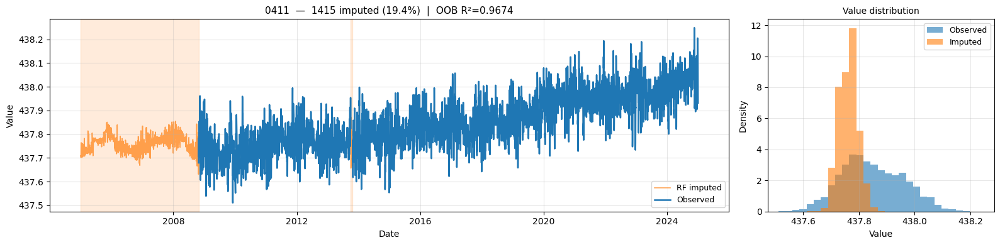

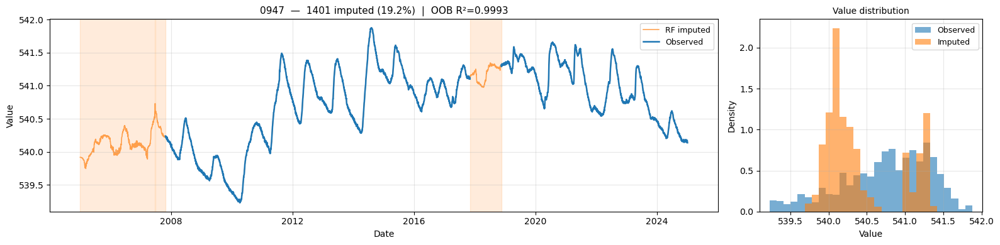

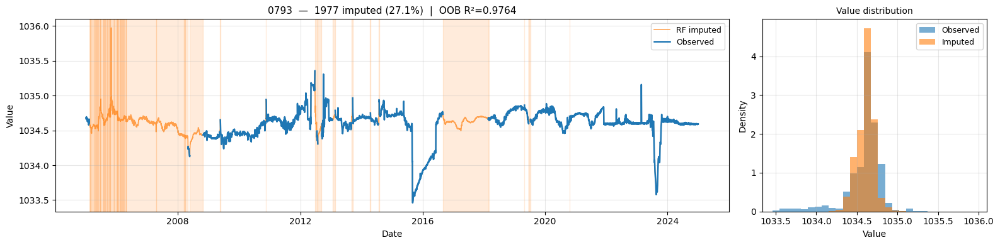

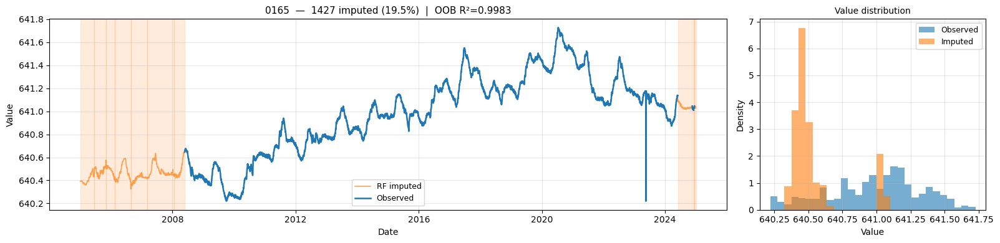

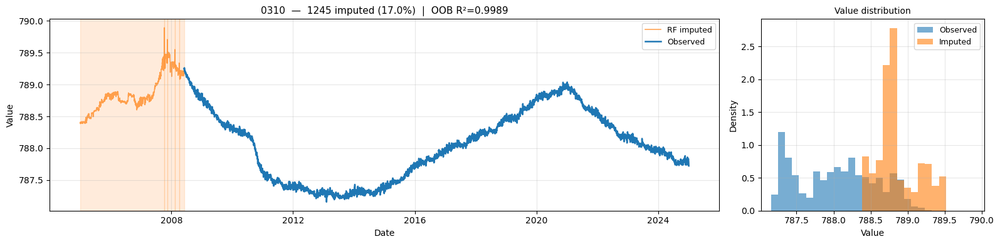

...

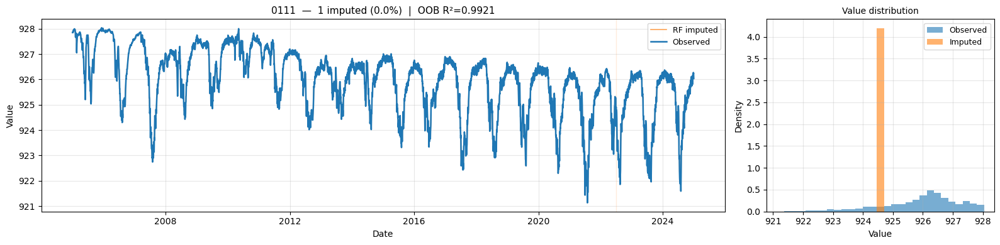

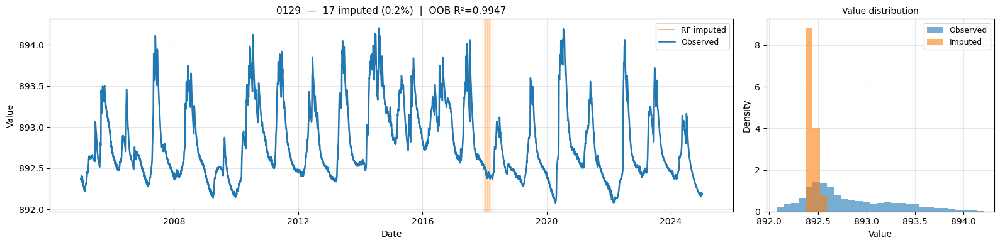

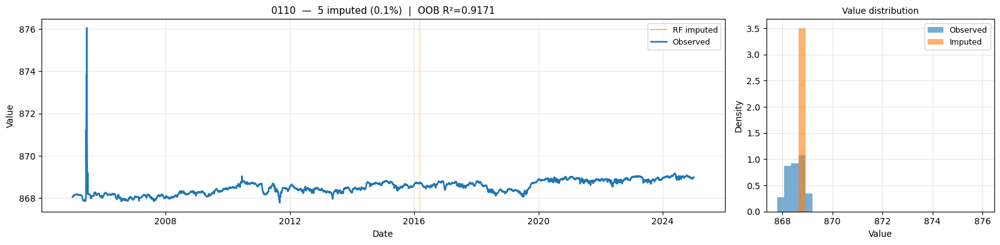

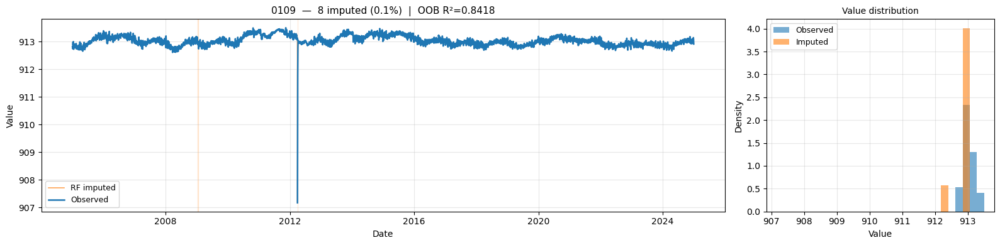

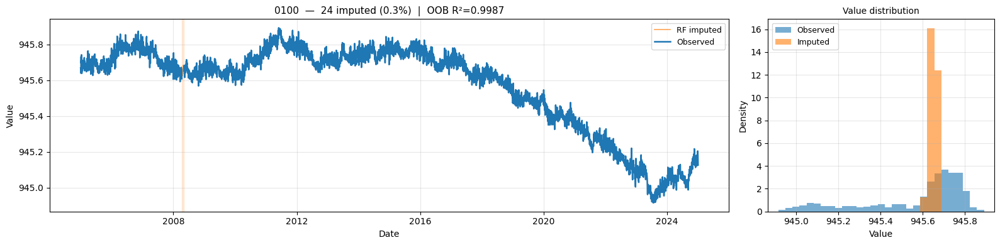

In [8]:
import matplotlib.pyplot as plt
import numpy as np

for col in df.columns:
    y_orig = df[col]
    y_fill = df_imputed_rf[col]
    is_missing = y_orig.isna()
    n_missing = int(is_missing.sum())

    if n_missing == 0:
        continue

    fig, (ax_main, ax_zoom) = plt.subplots(
        1, 2, figsize=(16, 4),
        gridspec_kw={"width_ratios": [3, 1]}
    )

    # ── Left: full time series ────────────────────────────────────
    # Imputed line drawn first (background)
    ax_main.plot(y_fill.index, y_fill,
                 color="C1", lw=1.2, alpha=0.7, zorder=1, label="RF imputed")
    # Observed on top — NaN gaps show as natural breaks
    ax_main.plot(y_orig.index, y_orig,
                 color="C0", lw=1.8, zorder=2, label="Observed")

    # Shade imputed (missing) regions
    dates = y_orig.index
    miss_arr = is_missing.values
    i = 0
    while i < len(miss_arr):
        if miss_arr[i]:
            j = i
            while j < len(miss_arr) and miss_arr[j]:
                j += 1
            ax_main.axvspan(dates[i], dates[min(j, len(dates) - 1)],
                            color="C1", alpha=0.15, zorder=0)
            i = j
        else:
            i += 1

    # OOB R² in title
    score_str = ""
    try:
        s = scores[col]
        if not np.isnan(s) and s < 1.0:
            score_str = f"  |  OOB R²={s:.4f}"
    except (NameError, KeyError):
        pass

    pct = 100 * n_missing / len(y_orig)
    ax_main.set_title(f"{col}  —  {n_missing} imputed ({pct:.1f}%){score_str}", fontsize=11)
    ax_main.set_xlabel("Date")
    ax_main.set_ylabel("Value")
    ax_main.legend(fontsize=9)
    ax_main.grid(True, alpha=0.3)

    # ── Right: distribution comparison ───────────────────────────
    obs_vals    = y_orig.dropna().values
    imputed_vals = y_fill[is_missing].values

    bins = np.linspace(
        min(obs_vals.min(), imputed_vals.min()),
        max(obs_vals.max(), imputed_vals.max()),
        30
    )
    ax_zoom.hist(obs_vals,     bins=bins, alpha=0.6, color="C0", label="Observed", density=True)
    ax_zoom.hist(imputed_vals, bins=bins, alpha=0.6, color="C1", label="Imputed",  density=True)
    ax_zoom.set_title("Value distribution", fontsize=10)
    ax_zoom.set_xlabel("Value")
    ax_zoom.set_ylabel("Density")
    ax_zoom.legend(fontsize=9)
    ax_zoom.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


In [9]:
df_imputed_rf.to_csv(DATA / "combined_absval_20052024_filled.csv")